In [1]:
import optuna
import mlflow
import mlflow.sklearn
import matplotlib.pyplot as plt
import seaborn           as sns
import numpy             as np
import pandas            as pd

from sklearn.model_selection         import train_test_split
from sklearn.metrics                 import *
from sklearn.feature_extraction.text import TfidfVectorizer
from mlflow.models.signature         import infer_signature
from sklearn.linear_model            import LogisticRegression
from sklearn.svm                     import SVC
from xgboost                         import XGBClassifier
from lightgbm                        import LGBMClassifier
from sklearn.neighbors               import KNeighborsClassifier
from sklearn.naive_bayes             import MultinomialNB
from sklearn.ensemble                import RandomForestClassifier
from imblearn.over_sampling          import SMOTE

In [2]:
df = pd.read_csv('preprocessed_corpus.csv')
df.head()

,raw_comment,category,word_count_raw,char_count_raw,num_unique_words,num_upper_words,num_punctuation_raw,cleaned_comment,num_stop_words,processed_comment,final_word_count,final_char_count
0,family mormon have never tried explain them t...,1,39,261,34,0,0,family mormon have never tried explain them th...,13,family mormon never tried explain still stare ...,26,171
1,buddhism has very much lot compatible with chr...,1,196,1269,136,0,0,buddhism has very much lot compatible with chr...,56,buddhism much lot compatible christianity espe...,140,842
2,seriously don say thing first all they won get...,-1,86,460,67,0,0,seriously don say thing first all they won get...,40,seriously say thing first get complex explain ...,46,230
3,what you have learned yours and only yours wha...,0,29,168,24,0,0,what you have learned yours and only yours wha...,14,learned want teach different focus goal not wr...,15,87
4,for your own benefit you may want read living ...,1,112,691,82,0,0,for your own benefit you may want read living ...,46,benefit may want read living buddha living chr...,66,397


In [3]:
# Step 2: Set up the MLflow tracking server
mlflow.set_tracking_uri("http://ec2-13-233-244-190.ap-south-1.compute.amazonaws.com:5000/")

In [4]:
# create an experiment 
mlflow.create_experiment(
                            name              = "Experiment_9_LightGBM_with_hpt",
                            artifact_location = "s3://mlflow-s3-25/Experiment_9_LightGBM_with_hpt"
                        )

'790731355789311940'

In [5]:
# set an experiment
mlflow.set_experiment("Experiment_9_LightGBM_with_hpt")

<Experiment: artifact_location='s3://mlflow-s3-25/Experiment_9_LightGBM_with_hpt', creation_time=1757044346736, experiment_id='790731355789311940', last_update_time=1757044346736, lifecycle_stage='active', name='Experiment_9_LightGBM_with_hpt', tags={}>

In [6]:
# # Step 1: Remap the class labels from [-1, 0, 1] to [2, 0, 1]
# df['category']       = df['category'].map({-1: 2, 0: 0, 1: 1})

# # Step 4: Train-test split before vectorization and resampling
# X_train, X_test, y_train, y_test = train_test_split(df['processed_comment'], df['category'], test_size=0.2, random_state=42, stratify=df['category'])

# # Step 2: Vectorization using TF-IDF, fit on training data only
# ngram_range          = (1, 3)                                    # Trigram setting
# max_features         = 1000                                      # Set max_features to 1000 for TF-IDF

# vectorizer           = TfidfVectorizer(ngram_range=ngram_range, max_features=max_features)
# X_train_vec          = vectorizer.fit_transform(X_train)          # Fit on training data
# X_test_vec           = vectorizer.transform    (X_test)           # Transform test data

# smote                = SMOTE(random_state=42)
# X_train_vec, y_train = smote.fit_resample(X_train_vec, y_train)

In [15]:
# Step 3: TF-IDF vectorizer setup
ngram_range = (1, 3)  # Trigram
max_features = 1000  # Set max_features to 1000
vectorizer = TfidfVectorizer(ngram_range=ngram_range, max_features=max_features)
X = vectorizer.fit_transform(df['processed_comment'])
y = df['category']

# Step 4: Apply SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 5: Train-test split
X_train_vec, X_test_vec, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled)

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


In [16]:
# Function to log results in MLflow
def log_mlflow(model_name, model, params):
    with mlflow.start_run() as run:
        # Log model type
        mlflow.set_tag("mlflow.runName",  f"{model_name}_SMOTE_TFIDF_Trigrams")
        mlflow.set_tag("experiment_type", "algorithm_comparison")

        # Log algorithm name as a parameter
        mlflow.log_param("algo_name", model_name)

        # Log hyperparameters
        for key, value in params.items():
            mlflow.log_param(key, value)
            
        # Train model
        model.fit(X_train_vec, y_train)

        # Step 6: Make predictions and log metrics
        y_pred             = model.predict(X_test_vec)

        # Step 5: Compute Evaluation Metrics
        accuracy           = accuracy_score       (y_test, y_pred)
        
        macro_precision    = precision_score      (y_test, y_pred, average='macro')
        macro_recall       = recall_score         (y_test, y_pred, average='macro')            # Recall or Sensitivity
        macro_F1_score     = f1_score             (y_test, y_pred, average='macro')
        macro_roc_auc      = roc_auc_score        (y_test, model.predict_proba(X_test_vec), average='macro', multi_class='ovr')
        weighted_precision = precision_score      (y_test, y_pred, average='weighted')
        weighted_recall    = recall_score         (y_test, y_pred, average='weighted')         # Recall or Sensitivity
        weighted_F1_score  = f1_score             (y_test, y_pred, average='weighted')
        weighted_roc_auc   = roc_auc_score        (y_test, model.predict_proba(X_test_vec), average='weighted', multi_class='ovr')
        
        log_loss_value     = log_loss             (y_test, model.predict_proba(X_test_vec))
        cm                 = confusion_matrix     (y_test,y_pred)
        cr                 = classification_report(y_test, y_pred)
        
        # Step 7: Log Class-wise Metrics from Classification Report
        classification_rep = classification_report(y_test, y_pred, output_dict=True)

        for label, metrics in classification_rep.items():
            clean_label    = label.replace(" avg", "")                   # Remove " avg" from label if present
            if isinstance(metrics, dict):
                for metric, value in metrics.items():
                    mlflow.log_metric(f"{clean_label}_{metric}", value)  
            else:
                mlflow.log_metric(f"{clean_label}", metrics)             # Logs accuracy metric
        
        # Step 6: Log Remaining Metrics to MLflow
        mlflow.log_metric("log_loss",         log_loss_value)        
        mlflow.log_metric("macro_roc_auc",    macro_roc_auc)
        mlflow.log_metric("weighted_roc_auc", weighted_roc_auc)
        
        # Step 8: Plot and Log Confusion Matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title(f"Confusion Matrix : {model_name}_model")
        plt.savefig("confusion_matrix.png")
        mlflow.log_artifact("confusion_matrix.png")
    
        # Step 9: saving and logging the dataset
        df.to_csv("dataset.csv", index=False)
        mlflow.log_artifact("dataset.csv")
        
        # Step 10: Log Model and Dataset
        input_example = X_test_vec[:5]                                           # input_example provides a sample input for the model, 
                                                                                 # useful for UI display and validation
        signature     = infer_signature(X_train_vec, model.predict(X_train_vec)) # signature defines the expected input/output schema of the model, 
                                                                                 # enabling reproducibility and serving
        
        mlflow.sklearn.log_model(
                                    sk_model      = model,
                                    name          = f"{model_name}_model",
                                    input_example = input_example,
                                    signature     = signature
                                ) 
        # Step 11: Print Evaluation Summary
        print(f"\033[1m\033[4mEvaluation Metrics : {model_name}_model\033[0m : (values close to 1 represent the GOOD Model)\n")
        print(f'\tAccuracy     : {accuracy:.2f}    --> [TP + TN]/ALL       : The proportion of correctly predicted observations over total predictions')
        print(f'\tLog Loss     : {log_loss_value:.2f}    --> Measures the performance of a classification model, Less is Good')
        print(f'\t\033[1m\033[4mMacro\033[0m  \t\t       --> Macro average       : Treats all classes equally by computing the unweighted mean of per-class metrics')
        print(f'\t  Precision  : {macro_precision:.2f}    --> [TP]     /[TP + FP] : The proportion of true positive predictions over total positive predictions ')
        print(f'\t  Recall     : {macro_recall:.2f}    --> [TP]     /[TP + FN] : The proportion of true positive predictions over total actual positives.')
        print(f'\t  F1-Score   : {macro_F1_score:.2f}    --> The harmonic mean of precision and recall, useful when FP and FN both have serious consequences')
        print(f'\t  ROC-AUC    : {macro_roc_auc:.2f}    --> Measures the ability of the model to distinguish between classes.')
        
        print(f'\t\033[1m\033[4mWeighted\033[0m  \t       --> Weighted average    : Accounts for class imbalance by weighting each class metric by its support')
        print(f'\t  Precision  : {weighted_precision:.2f}    --> [TP]     /[TP + FP] : The proportion of true positive predictions over total positive predictions ')
        print(f'\t  Recall     : {weighted_recall:.2f}    --> [TP]     /[TP + FN] : The proportion of true positive predictions over total actual positives.')
        print(f'\t  F1-Score   : {weighted_F1_score:.2f}    --> The harmonic mean of precision and recall, useful when FP and FN both have serious consequences')
        print(f'\t  ROC-AUC    : {weighted_roc_auc:.2f}    --> Measures the ability of the model to distinguish between classes.')
        
        
        print(f'\nConfusion Matix      :         -->    \033[1m\033[4mORIGINAL\033[0m     \t\t\033[1m\033[4mSTANDARD\033[0m\n')
        def format_row(row):
            formatted = ' '.join(f"{val:>2}" for val in row)
            return f"[{formatted}]"
        
        for row1, row2 in zip(cm, np.flip(cm)):
            print("\t\t\t\t  ", format_row(row1), "\t       ", format_row(row2))
        
        print("\nClassification Rpt   :")
        print('\n'.join('\t\t\t\t' + line for line in cr.splitlines()))

In [17]:
# Step 6: Optuna objective function for LightGBM
def objective_lightgbm(trial):
    # Hyperparameter space to explore
    n_estimators      = trial.suggest_int  ('n_estimators',      100, 1000)
    learning_rate     = trial.suggest_float('learning_rate',     1e-4, 1e-1, log=True)
    max_depth         = trial.suggest_int  ('max_depth',         3, 15)
    num_leaves        = trial.suggest_int  ('num_leaves',        20, 150)
    min_child_samples = trial.suggest_int  ('min_child_samples', 10, 100)
    colsample_bytree  = trial.suggest_float('colsample_bytree',  0.5, 1.0)
    subsample         = trial.suggest_float('subsample',         0.5, 1.0)
    reg_alpha         = trial.suggest_float('reg_alpha',         1e-4, 10.0, log=True)   # L1 regularization
    reg_lambda        = trial.suggest_float('reg_lambda',        1e-4, 10.0, log=True)   # L2 regularization


    # Create LightGBM model
    model = LGBMClassifier(
                            n_estimators      = n_estimators,
                            learning_rate     = learning_rate,
                            max_depth         = max_depth,
                            num_leaves        = num_leaves,
                            min_child_samples = min_child_samples,
                            colsample_bytree  = colsample_bytree,
                            subsample         = subsample,
                            reg_alpha         = reg_alpha,
                            reg_lambda        = reg_lambda,
                            random_state      = 42
                          )
    
    return accuracy_score(y_test, model.fit(X_train_vec, y_train).predict(X_test_vec))

In [18]:
# Run Optuna hyperparameter optimization for xgboost and log the best model only
def run_optuna_experiment():
    study         = optuna.create_study(direction="maximize")                         # Create an Optuna study to maximize accuracy
    study.optimize(objective_lightgbm, n_trials=100)                                  # Run optimization for 30 trials using the objective function


    best_params   = study.best_params                                                 # Retrieve the best hyperparameters from the study
    best_model    = LGBMClassifier(                                                    # Rebuild the model using the best-found parameters
                                    n_estimators      = best_params['n_estimators'],
                                    learning_rate     = best_params['learning_rate'],
                                    max_depth         = best_params['max_depth'],
                                    num_leaves        = best_params['num_leaves'],
                                    min_child_samples = best_params['min_child_samples'],
                                    colsample_bytree  = best_params['colsample_bytree'],
                                    subsample         = best_params['subsample'],
                                    reg_alpha         = best_params['reg_alpha'],
                                    reg_lambda        = best_params['reg_lambda'],
                                    random_state      = 42
                                  )

    return study, best_model                                                                    

In [19]:
# Run the experiment for LightGBM
study, best_model = run_optuna_experiment()

[I 2025-09-05 09:26:12,535] A new study created in memory with name: no-name-4452e4fe-d098-4528-860f-93e5f6acff1b


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045059 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:26:41,178] Trial 0 finished with value: 0.796131896005073 and parameters: {'n_estimators': 857, 'learning_rate': 0.059039145329659856, 'max_depth': 14, 'num_leaves': 55, 'min_child_samples': 56, 'colsample_bytree': 0.7005897517733656, 'subsample': 0.9010393680367852, 'reg_alpha': 0.0001574770224830946, 'reg_lambda': 0.00033296641713849657}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047614 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101522
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 956
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:26:45,505] Trial 1 finished with value: 0.595434369055168 and parameters: {'n_estimators': 357, 'learning_rate': 0.0033055921939921396, 'max_depth': 3, 'num_leaves': 35, 'min_child_samples': 78, 'colsample_bytree': 0.8444451448126455, 'subsample': 0.694858390785077, 'reg_alpha': 0.01969661017660288, 'reg_lambda': 0.9343502199173673}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101463
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 954
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:26:57,981] Trial 2 finished with value: 0.7344113295286409 and parameters: {'n_estimators': 568, 'learning_rate': 0.010360682021892127, 'max_depth': 6, 'num_leaves': 109, 'min_child_samples': 86, 'colsample_bytree': 0.5987052631470882, 'subsample': 0.8632926538383168, 'reg_alpha': 0.0012350395087406207, 'reg_lambda': 0.0063591105995566425}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045791 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101824
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:27:27,466] Trial 3 finished with value: 0.6750158528852251 and parameters: {'n_estimators': 460, 'learning_rate': 0.001633949823086691, 'max_depth': 12, 'num_leaves': 90, 'min_child_samples': 19, 'colsample_bytree': 0.8211054411974963, 'subsample': 0.639083642519947, 'reg_alpha': 0.0003158290898692727, 'reg_lambda': 6.96844847795344}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101432
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 953
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:27:53,222] Trial 4 finished with value: 0.7777425491439443 and parameters: {'n_estimators': 895, 'learning_rate': 0.01123657310645283, 'max_depth': 9, 'num_leaves': 135, 'min_child_samples': 89, 'colsample_bytree': 0.6208994799256198, 'subsample': 0.7963776737802055, 'reg_alpha': 0.0003231357395818819, 'reg_lambda': 0.017272011073105}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101522
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 956
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:28:11,321] Trial 5 finished with value: 0.7942295497780596 and parameters: {'n_estimators': 715, 'learning_rate': 0.09619353201021354, 'max_depth': 12, 'num_leaves': 83, 'min_child_samples': 77, 'colsample_bytree': 0.570463009006221, 'subsample': 0.8115221749569894, 'reg_alpha': 0.00017106820746660308, 'reg_lambda': 0.022778947853740503}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044860 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:28:33,182] Trial 6 finished with value: 0.6230183893468612 and parameters: {'n_estimators': 564, 'learning_rate': 0.0002713791131601108, 'max_depth': 7, 'num_leaves': 116, 'min_child_samples': 41, 'colsample_bytree': 0.8315372219905832, 'subsample': 0.6384400841883155, 'reg_alpha': 0.017970354084514254, 'reg_lambda': 0.07734426939511457}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036992 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:29:19,319] Trial 7 finished with value: 0.7005918410484041 and parameters: {'n_estimators': 753, 'learning_rate': 0.001929955741971985, 'max_depth': 11, 'num_leaves': 140, 'min_child_samples': 50, 'colsample_bytree': 0.5927879545184578, 'subsample': 0.7067243952306514, 'reg_alpha': 0.0003598293443609535, 'reg_lambda': 0.0003333965571675345}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101463
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 954
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:29:45,567] Trial 8 finished with value: 0.665292749947157 and parameters: {'n_estimators': 753, 'learning_rate': 0.0001670212591268112, 'max_depth': 12, 'num_leaves': 88, 'min_child_samples': 88, 'colsample_bytree': 0.7685011092620795, 'subsample': 0.7723387471211772, 'reg_alpha': 0.008099181293181488, 'reg_lambda': 7.555688030187061}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:30:48,651] Trial 9 finished with value: 0.6806172056647644 and parameters: {'n_estimators': 830, 'learning_rate': 0.0001308035367805178, 'max_depth': 13, 'num_leaves': 123, 'min_child_samples': 35, 'colsample_bytree': 0.7246133918338944, 'subsample': 0.6837677527674118, 'reg_alpha': 0.0034656773439333, 'reg_lambda': 0.6113357129386928}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101724
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:30:56,468] Trial 10 finished with value: 0.7951807228915663 and parameters: {'n_estimators': 205, 'learning_rate': 0.07690005558857087, 'max_depth': 15, 'num_leaves': 34, 'min_child_samples': 59, 'colsample_bytree': 0.9381436098278189, 'subsample': 0.9938553135346535, 'reg_alpha': 0.5304745619599589, 'reg_lambda': 0.0002666285440280139}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044422 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101620
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 960
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:31:01,298] Trial 11 finished with value: 0.7911646586345381 and parameters: {'n_estimators': 122, 'learning_rate': 0.09649738548263583, 'max_depth': 15, 'num_leaves': 34, 'min_child_samples': 65, 'colsample_bytree': 0.9255167185321128, 'subsample': 0.9838121132506291, 'reg_alpha': 1.5775900155024294, 'reg_lambda': 0.00028023299423034865}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101620
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 960
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:31:08,827] Trial 12 finished with value: 0.7541745931092793 and parameters: {'n_estimators': 130, 'learning_rate': 0.02770942560184264, 'max_depth': 15, 'num_leaves': 57, 'min_child_samples': 62, 'colsample_bytree': 0.9794629564089717, 'subsample': 0.9983681714566294, 'reg_alpha': 0.4115662936243039, 'reg_lambda': 0.0015095051171261113}. Best is trial 0 with value: 0.796131896005073.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:31:35,237] Trial 13 finished with value: 0.7984569858380892 and parameters: {'n_estimators': 980, 'learning_rate': 0.032393324222092276, 'max_depth': 15, 'num_leaves': 20, 'min_child_samples': 52, 'colsample_bytree': 0.6937963230473951, 'subsample': 0.9130548834908074, 'reg_alpha': 0.2546076604834302, 'reg_lambda': 0.00011106902019801118}. Best is trial 13 with value: 0.7984569858380892.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101766
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 968
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:32:05,260] Trial 14 finished with value: 0.7987740435425914 and parameters: {'n_estimators': 954, 'learning_rate': 0.03315222192150118, 'max_depth': 10, 'num_leaves': 58, 'min_child_samples': 29, 'colsample_bytree': 0.6916329626936207, 'subsample': 0.891324168822982, 'reg_alpha': 0.11309879547205944, 'reg_lambda': 0.00011815535628018085}. Best is trial 14 with value: 0.7987740435425914.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:32:36,481] Trial 15 finished with value: 0.7975058127245825 and parameters: {'n_estimators': 990, 'learning_rate': 0.019498907815818662, 'max_depth': 9, 'num_leaves': 58, 'min_child_samples': 10, 'colsample_bytree': 0.5156647111211438, 'subsample': 0.511965546445533, 'reg_alpha': 0.12417068842166808, 'reg_lambda': 0.0019431524597599986}. Best is trial 14 with value: 0.7987740435425914.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101755
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 967
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:32:56,534] Trial 16 finished with value: 0.7190868738110336 and parameters: {'n_estimators': 988, 'learning_rate': 0.005722186685950385, 'max_depth': 6, 'num_leaves': 73, 'min_child_samples': 32, 'colsample_bytree': 0.6779801832637141, 'subsample': 0.913610163091195, 'reg_alpha': 7.709875462498858, 'reg_lambda': 0.00010919437331011803}. Best is trial 14 with value: 0.7987740435425914.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101811
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 973
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:33:14,129] Trial 17 finished with value: 0.7994081589515959 and parameters: {'n_estimators': 631, 'learning_rate': 0.034189944711035446, 'max_depth': 10, 'num_leaves': 23, 'min_child_samples': 24, 'colsample_bytree': 0.7538159925937128, 'subsample': 0.8584653224728932, 'reg_alpha': 0.09698507429231314, 'reg_lambda': 0.0015934744977043162}. Best is trial 17 with value: 0.7994081589515959.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052643 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101845
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:33:34,288] Trial 18 finished with value: 0.663284717818643 and parameters: {'n_estimators': 648, 'learning_rate': 0.000609382863636662, 'max_depth': 10, 'num_leaves': 20, 'min_child_samples': 17, 'colsample_bytree': 0.7791177578935264, 'subsample': 0.839558139864496, 'reg_alpha': 0.0683472270457087, 'reg_lambda': 0.0013718327146961268}. Best is trial 17 with value: 0.7994081589515959.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101811
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 973
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:33:46,085] Trial 19 finished with value: 0.7318748678926231 and parameters: {'n_estimators': 427, 'learning_rate': 0.011694878824653945, 'max_depth': 7, 'num_leaves': 43, 'min_child_samples': 24, 'colsample_bytree': 0.6494327393946329, 'subsample': 0.8710048955809782, 'reg_alpha': 1.8230761115186622, 'reg_lambda': 0.00476923203004923}. Best is trial 17 with value: 0.7994081589515959.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.043375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:33:58,019] Trial 20 finished with value: 0.7791164658634538 and parameters: {'n_estimators': 294, 'learning_rate': 0.03027776567524556, 'max_depth': 10, 'num_leaves': 72, 'min_child_samples': 42, 'colsample_bytree': 0.7497106653786056, 'subsample': 0.9343398182870312, 'reg_alpha': 0.055740944378736744, 'reg_lambda': 0.18772131452413302}. Best is trial 17 with value: 0.7994081589515959.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046909 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101766
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 968
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:34:17,023] Trial 21 finished with value: 0.7990911012470936 and parameters: {'n_estimators': 910, 'learning_rate': 0.03966840402867673, 'max_depth': 8, 'num_leaves': 20, 'min_child_samples': 27, 'colsample_bytree': 0.6585865554371505, 'subsample': 0.9327060732120004, 'reg_alpha': 0.34883420092369277, 'reg_lambda': 0.0007447484559578555}. Best is trial 17 with value: 0.7994081589515959.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044926 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101766
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 968
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:34:37,223] Trial 22 finished with value: 0.8013105051786091 and parameters: {'n_estimators': 895, 'learning_rate': 0.046850993114902, 'max_depth': 8, 'num_leaves': 45, 'min_child_samples': 28, 'colsample_bytree': 0.6495788880165027, 'subsample': 0.9453984569398741, 'reg_alpha': 1.1280796211771107, 'reg_lambda': 0.0009312771783690063}. Best is trial 22 with value: 0.8013105051786091.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.036887 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:34:53,041] Trial 23 finished with value: 0.7997252166560981 and parameters: {'n_estimators': 642, 'learning_rate': 0.04839164839714505, 'max_depth': 8, 'num_leaves': 43, 'min_child_samples': 14, 'colsample_bytree': 0.5438669000617278, 'subsample': 0.9502307054202281, 'reg_alpha': 1.157278854743443, 'reg_lambda': 0.004328569692600347}. Best is trial 22 with value: 0.8013105051786091.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101873
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 983
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:35:02,702] Trial 24 finished with value: 0.7446628619742126 and parameters: {'n_estimators': 640, 'learning_rate': 0.01823178571233101, 'max_depth': 4, 'num_leaves': 49, 'min_child_samples': 11, 'colsample_bytree': 0.5174161965757775, 'subsample': 0.9571374154000674, 'reg_alpha': 2.138502359170939, 'reg_lambda': 0.005774985261232892}. Best is trial 22 with value: 0.8013105051786091.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101202
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 946
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:35:12,601] Trial 25 finished with value: 0.696998520397379 and parameters: {'n_estimators': 497, 'learning_rate': 0.006391800731935001, 'max_depth': 7, 'num_leaves': 41, 'min_child_samples': 100, 'colsample_bytree': 0.5621765428829133, 'subsample': 0.8264499958280952, 'reg_alpha': 6.064616968440257, 'reg_lambda': 0.01092637136047862}. Best is trial 22 with value: 0.8013105051786091.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101824
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:35:22,582] Trial 26 finished with value: 0.7957091523990699 and parameters: {'n_estimators': 660, 'learning_rate': 0.0538110933844139, 'max_depth': 5, 'num_leaves': 69, 'min_child_samples': 19, 'colsample_bytree': 0.6332307480218248, 'subsample': 0.9509273311982782, 'reg_alpha': 0.9148432152667018, 'reg_lambda': 0.002875062503079382}. Best is trial 22 with value: 0.8013105051786091.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:35:40,413] Trial 27 finished with value: 0.7830268442189812 and parameters: {'n_estimators': 775, 'learning_rate': 0.019036063524987788, 'max_depth': 8, 'num_leaves': 29, 'min_child_samples': 38, 'colsample_bytree': 0.5532800123864792, 'subsample': 0.8619242428290772, 'reg_alpha': 3.362036248393275, 'reg_lambda': 0.0009881561708119254}. Best is trial 22 with value: 0.8013105051786091.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:35:52,044] Trial 28 finished with value: 0.795286408793067 and parameters: {'n_estimators': 540, 'learning_rate': 0.046490630095200124, 'max_depth': 8, 'num_leaves': 45, 'min_child_samples': 46, 'colsample_bytree': 0.5009772816125684, 'subsample': 0.9645099228716921, 'reg_alpha': 0.17365807900222463, 'reg_lambda': 0.06924842347677648}. Best is trial 22 with value: 0.8013105051786091.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101811
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 973
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:36:18,204] Trial 29 finished with value: 0.8028957937011203 and parameters: {'n_estimators': 826, 'learning_rate': 0.05927908752133762, 'max_depth': 11, 'num_leaves': 51, 'min_child_samples': 23, 'colsample_bytree': 0.8024155780394715, 'subsample': 0.7563203540224834, 'reg_alpha': 0.8689829558107597, 'reg_lambda': 0.0005527411070275926}. Best is trial 29 with value: 0.8028957937011203.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:36:42,837] Trial 30 finished with value: 0.8021559923906151 and parameters: {'n_estimators': 832, 'learning_rate': 0.05906775413640729, 'max_depth': 9, 'num_leaves': 97, 'min_child_samples': 16, 'colsample_bytree': 0.8850465405454566, 'subsample': 0.7507609516283925, 'reg_alpha': 3.942851532068992, 'reg_lambda': 0.0005667921543747031}. Best is trial 29 with value: 0.8028957937011203.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045291 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:37:06,622] Trial 31 finished with value: 0.8031071655041218 and parameters: {'n_estimators': 827, 'learning_rate': 0.059324461814998355, 'max_depth': 9, 'num_leaves': 99, 'min_child_samples': 16, 'colsample_bytree': 0.8785488085318022, 'subsample': 0.7486411008557012, 'reg_alpha': 0.9588851514445167, 'reg_lambda': 0.0007004238236796144}. Best is trial 31 with value: 0.8031071655041218.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101818
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:37:34,576] Trial 32 finished with value: 0.8023673641936165 and parameters: {'n_estimators': 843, 'learning_rate': 0.065980202340575, 'max_depth': 11, 'num_leaves': 100, 'min_child_samples': 20, 'colsample_bytree': 0.8752415624476644, 'subsample': 0.7374707446483892, 'reg_alpha': 3.7238751502345018, 'reg_lambda': 0.000560527473245767}. Best is trial 31 with value: 0.8031071655041218.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101818
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:38:02,265] Trial 33 finished with value: 0.8026844218981188 and parameters: {'n_estimators': 835, 'learning_rate': 0.07063635031303608, 'max_depth': 11, 'num_leaves': 100, 'min_child_samples': 21, 'colsample_bytree': 0.9026796455278013, 'subsample': 0.7464767200924078, 'reg_alpha': 4.103182213913222, 'reg_lambda': 0.0005153258935304104}. Best is trial 31 with value: 0.8031071655041218.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044162 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101811
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 973
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:38:32,128] Trial 34 finished with value: 0.797717184527584 and parameters: {'n_estimators': 824, 'learning_rate': 0.06912392092500363, 'max_depth': 13, 'num_leaves': 102, 'min_child_samples': 22, 'colsample_bytree': 0.8745413859126577, 'subsample': 0.7210086797554334, 'reg_alpha': 7.783100851305849, 'reg_lambda': 0.000493318680246052}. Best is trial 31 with value: 0.8031071655041218.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101755
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 967
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:38:59,680] Trial 35 finished with value: 0.7941238638765589 and parameters: {'n_estimators': 706, 'learning_rate': 0.020662259403590063, 'max_depth': 11, 'num_leaves': 109, 'min_child_samples': 33, 'colsample_bytree': 0.8032844801216904, 'subsample': 0.6649464049910274, 'reg_alpha': 0.6041304547053135, 'reg_lambda': 0.0002315128800181664}. Best is trial 31 with value: 0.8031071655041218.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101824
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:39:27,248] Trial 36 finished with value: 0.8015218769816107 and parameters: {'n_estimators': 881, 'learning_rate': 0.09996254157246282, 'max_depth': 11, 'num_leaves': 80, 'min_child_samples': 19, 'colsample_bytree': 0.8834349309966191, 'subsample': 0.7382212553093449, 'reg_alpha': 3.2397441939247793, 'reg_lambda': 0.002758604903747633}. Best is trial 31 with value: 0.8031071655041218.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:40:20,015] Trial 37 finished with value: 0.7570281124497992 and parameters: {'n_estimators': 795, 'learning_rate': 0.00688945289490634, 'max_depth': 13, 'num_leaves': 125, 'min_child_samples': 10, 'colsample_bytree': 0.8579189689791432, 'subsample': 0.7796361579317793, 'reg_alpha': 9.943917834965303, 'reg_lambda': 2.386995571019935}. Best is trial 31 with value: 0.8031071655041218.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101811
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 973
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:41:15,773] Trial 38 finished with value: 0.670999788628197 and parameters: {'n_estimators': 933, 'learning_rate': 0.0007790056717770909, 'max_depth': 12, 'num_leaves': 95, 'min_child_samples': 22, 'colsample_bytree': 0.9240700482079955, 'subsample': 0.6018935375917589, 'reg_alpha': 4.01843574021444, 'reg_lambda': 0.00044313153877748333}. Best is trial 31 with value: 0.8031071655041218.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:41:50,481] Trial 39 finished with value: 0.7871485943775101 and parameters: {'n_estimators': 716, 'learning_rate': 0.013493747283476167, 'max_depth': 11, 'num_leaves': 109, 'min_child_samples': 38, 'colsample_bytree': 0.8069527585487652, 'subsample': 0.7653699675171821, 'reg_alpha': 0.02519397188790056, 'reg_lambda': 0.00019294104402224965}. Best is trial 31 with value: 0.8031071655041218.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101572
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 958
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:42:15,909] Trial 40 finished with value: 0.7975058127245825 and parameters: {'n_estimators': 872, 'learning_rate': 0.06846994796827882, 'max_depth': 12, 'num_leaves': 116, 'min_child_samples': 71, 'colsample_bytree': 0.9879203077827532, 'subsample': 0.7944492510192879, 'reg_alpha': 0.7144907517514243, 'reg_lambda': 0.00814592672875152}. Best is trial 31 with value: 0.8031071655041218.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:42:39,905] Trial 41 finished with value: 0.8035299091101247 and parameters: {'n_estimators': 833, 'learning_rate': 0.06479291528960499, 'max_depth': 9, 'num_leaves': 95, 'min_child_samples': 15, 'colsample_bytree': 0.9102610979074113, 'subsample': 0.7305571753024581, 'reg_alpha': 3.057619054507943, 'reg_lambda': 0.0006065518913945337}. Best is trial 41 with value: 0.8035299091101247.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044268 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:43:04,843] Trial 42 finished with value: 0.8046924540266328 and parameters: {'n_estimators': 799, 'learning_rate': 0.06351925141566932, 'max_depth': 10, 'num_leaves': 101, 'min_child_samples': 15, 'colsample_bytree': 0.9035761556899591, 'subsample': 0.7227043394230438, 'reg_alpha': 2.4663510141243115, 'reg_lambda': 0.0007957454205727702}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101863
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 09:43:31,987] Trial 43 finished with value: 0.794440921581061 and parameters: {'n_estimators': 791, 'learning_rate': 0.023889812473666314, 'max_depth': 9, 'num_leaves': 90, 'min_child_samples': 13, 'colsample_bytree': 0.9514619142976432, 'subsample': 0.6930847997885717, 'reg_alpha': 1.5418137744856955, 'reg_lambda': 0.0001946990883481485}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101766
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 968
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:27:02,170] Trial 44 finished with value: 0.6935108856478546 and parameters: {'n_estimators': 728, 'learning_rate': 0.002505249324982203, 'max_depth': 10, 'num_leaves': 150, 'min_child_samples': 27, 'colsample_bytree': 0.9065686096080049, 'subsample': 0.6607083576783789, 'reg_alpha': 1.9145836801768277, 'reg_lambda': 0.0008794210617304994}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:27:35,666] Trial 45 finished with value: 0.8021559923906151 and parameters: {'n_estimators': 929, 'learning_rate': 0.07924386660201711, 'max_depth': 9, 'num_leaves': 82, 'min_child_samples': 16, 'colsample_bytree': 0.840683091352357, 'subsample': 0.7162586877453071, 'reg_alpha': 0.2855418878597789, 'reg_lambda': 0.002534358500343297}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050366 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101811
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 973
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:28:03,613] Trial 46 finished with value: 0.803846966814627 and parameters: {'n_estimators': 685, 'learning_rate': 0.0961592321383872, 'max_depth': 14, 'num_leaves': 104, 'min_child_samples': 23, 'colsample_bytree': 0.9546786434902506, 'subsample': 0.8028210693065986, 'reg_alpha': 2.5161358385250665, 'reg_lambda': 0.015688963195287828}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.042179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101755
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 967
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:28:29,499] Trial 47 finished with value: 0.79856267173959 and parameters: {'n_estimators': 678, 'learning_rate': 0.09718539187680675, 'max_depth': 13, 'num_leaves': 116, 'min_child_samples': 31, 'colsample_bytree': 0.9690890482105234, 'subsample': 0.814259355705103, 'reg_alpha': 0.0028987361220928526, 'reg_lambda': 0.03184684308198047}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:29:04,799] Trial 48 finished with value: 0.8016275628831114 and parameters: {'n_estimators': 595, 'learning_rate': 0.03965604270980342, 'max_depth': 14, 'num_leaves': 106, 'min_child_samples': 15, 'colsample_bytree': 0.9590561199066503, 'subsample': 0.7939962237341388, 'reg_alpha': 0.5615679581462915, 'reg_lambda': 0.015635231386352907}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101784
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 970
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:30:11,113] Trial 49 finished with value: 0.6855844430352991 and parameters: {'n_estimators': 783, 'learning_rate': 0.0010539035971489465, 'max_depth': 14, 'num_leaves': 127, 'min_child_samples': 25, 'colsample_bytree': 0.9148123010133372, 'subsample': 0.767611444660933, 'reg_alpha': 0.8001797396904315, 'reg_lambda': 0.03885050908865197}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:31:08,255] Trial 50 finished with value: 0.7488902980342422 and parameters: {'n_estimators': 752, 'learning_rate': 0.004355218016001364, 'max_depth': 14, 'num_leaves': 92, 'min_child_samples': 37, 'colsample_bytree': 0.939016213066254, 'subsample': 0.6157667209293607, 'reg_alpha': 0.000752330020715134, 'reg_lambda': 0.5109171423376007}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101818
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:31:40,608] Trial 51 finished with value: 0.803846966814627 and parameters: {'n_estimators': 848, 'learning_rate': 0.056296512096911874, 'max_depth': 12, 'num_leaves': 103, 'min_child_samples': 21, 'colsample_bytree': 0.9022448106396198, 'subsample': 0.7464459311493491, 'reg_alpha': 2.4113816998691076, 'reg_lambda': 0.00037901819057324036}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049778 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101863
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:32:11,336] Trial 52 finished with value: 0.8042697104206299 and parameters: {'n_estimators': 862, 'learning_rate': 0.05404534007875539, 'max_depth': 10, 'num_leaves': 85, 'min_child_samples': 13, 'colsample_bytree': 0.8567026194405544, 'subsample': 0.7063302799797812, 'reg_alpha': 2.4980167623296925, 'reg_lambda': 0.0003246613302029011}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040858 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101863
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:32:47,001] Trial 53 finished with value: 0.7991967871485943 and parameters: {'n_estimators': 870, 'learning_rate': 0.02544293692086212, 'max_depth': 10, 'num_leaves': 87, 'min_child_samples': 13, 'colsample_bytree': 0.9917906436036844, 'subsample': 0.6746719201835114, 'reg_alpha': 2.1789049843701123, 'reg_lambda': 0.00033588312822168884}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101824
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:33:17,351] Trial 54 finished with value: 0.7990911012470936 and parameters: {'n_estimators': 957, 'learning_rate': 0.037486074441813504, 'max_depth': 9, 'num_leaves': 78, 'min_child_samples': 18, 'colsample_bytree': 0.8556220260688494, 'subsample': 0.7089326931104222, 'reg_alpha': 6.076733477106979, 'reg_lambda': 0.0001370345093861684}. Best is trial 42 with value: 0.8046924540266328.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101873
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 983
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:33:50,700] Trial 55 finished with value: 0.8059606848446417 and parameters: {'n_estimators': 752, 'learning_rate': 0.07873653468711414, 'max_depth': 12, 'num_leaves': 103, 'min_child_samples': 11, 'colsample_bytree': 0.9394356802888786, 'subsample': 0.6445967968836925, 'reg_alpha': 1.4418259849978954, 'reg_lambda': 0.001121202880089726}. Best is trial 55 with value: 0.8059606848446417.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048561 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:34:25,348] Trial 56 finished with value: 0.8067004861551469 and parameters: {'n_estimators': 693, 'learning_rate': 0.08352703618765109, 'max_depth': 12, 'num_leaves': 112, 'min_child_samples': 10, 'colsample_bytree': 0.9393317004076235, 'subsample': 0.597251230855059, 'reg_alpha': 2.7120820307011293, 'reg_lambda': 0.001292474079173623}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:34:59,281] Trial 57 finished with value: 0.8056436271401395 and parameters: {'n_estimators': 691, 'learning_rate': 0.08443181569398121, 'max_depth': 13, 'num_leaves': 121, 'min_child_samples': 10, 'colsample_bytree': 0.939039903359993, 'subsample': 0.5685490348208426, 'reg_alpha': 1.4739629192674006, 'reg_lambda': 0.0003386250196758298}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.042930 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:35:35,509] Trial 58 finished with value: 0.8047981399281335 and parameters: {'n_estimators': 606, 'learning_rate': 0.07858157905501666, 'max_depth': 13, 'num_leaves': 119, 'min_child_samples': 10, 'colsample_bytree': 0.9403167347335345, 'subsample': 0.5630139703352973, 'reg_alpha': 1.3501112509356301, 'reg_lambda': 0.0014643913936335658}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:36:24,289] Trial 59 finished with value: 0.7891566265060241 and parameters: {'n_estimators': 597, 'learning_rate': 0.01508011775979509, 'max_depth': 13, 'num_leaves': 135, 'min_child_samples': 10, 'colsample_bytree': 0.9367873760312586, 'subsample': 0.5602593562424736, 'reg_alpha': 1.5124165850966762, 'reg_lambda': 0.0013150631544135752}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101863
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:36:58,997] Trial 60 finished with value: 0.79856267173959 and parameters: {'n_estimators': 530, 'learning_rate': 0.04295562383434242, 'max_depth': 12, 'num_leaves': 120, 'min_child_samples': 13, 'colsample_bytree': 0.9992398609950097, 'subsample': 0.5596071980429651, 'reg_alpha': 0.00010472787420877324, 'reg_lambda': 0.001997814501543995}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:37:37,617] Trial 61 finished with value: 0.8046924540266328 and parameters: {'n_estimators': 687, 'learning_rate': 0.09807709557825316, 'max_depth': 13, 'num_leaves': 113, 'min_child_samples': 10, 'colsample_bytree': 0.9692292953180647, 'subsample': 0.5523985097866843, 'reg_alpha': 0.4222193276225266, 'reg_lambda': 0.00387771694652057}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.061043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101873
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 983
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:38:15,991] Trial 62 finished with value: 0.8044810822236313 and parameters: {'n_estimators': 615, 'learning_rate': 0.0869311994439417, 'max_depth': 13, 'num_leaves': 131, 'min_child_samples': 11, 'colsample_bytree': 0.976994664512534, 'subsample': 0.5659389781517028, 'reg_alpha': 0.46266496187896217, 'reg_lambda': 0.0012904375535293783}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.058742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:38:50,736] Trial 63 finished with value: 0.8067004861551469 and parameters: {'n_estimators': 605, 'learning_rate': 0.08713258235553586, 'max_depth': 13, 'num_leaves': 131, 'min_child_samples': 10, 'colsample_bytree': 0.9609973999396787, 'subsample': 0.5508138188515793, 'reg_alpha': 0.4296814639609406, 'reg_lambda': 0.003452585382904792}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:39:21,994] Trial 64 finished with value: 0.803846966814627 and parameters: {'n_estimators': 574, 'learning_rate': 0.08075822524229394, 'max_depth': 13, 'num_leaves': 115, 'min_child_samples': 10, 'colsample_bytree': 0.9699451469183565, 'subsample': 0.5144495318975907, 'reg_alpha': 0.28297463617352253, 'reg_lambda': 0.008327436287498925}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056959 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101824
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:40:19,706] Trial 65 finished with value: 0.6595857112661171 and parameters: {'n_estimators': 461, 'learning_rate': 0.0003564881333211084, 'max_depth': 12, 'num_leaves': 141, 'min_child_samples': 18, 'colsample_bytree': 0.9344263644710755, 'subsample': 0.5368694815899746, 'reg_alpha': 0.20204392061315563, 'reg_lambda': 0.004012608190593567}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101522
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 956
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:40:57,048] Trial 66 finished with value: 0.7956034664975692 and parameters: {'n_estimators': 678, 'learning_rate': 0.032802644038045725, 'max_depth': 15, 'num_leaves': 120, 'min_child_samples': 79, 'colsample_bytree': 0.9493334856282485, 'subsample': 0.590345099522022, 'reg_alpha': 0.4349240791521526, 'reg_lambda': 0.0035366347859287217}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:41:24,290] Trial 67 finished with value: 0.7987740435425914 and parameters: {'n_estimators': 742, 'learning_rate': 0.08389338743996863, 'max_depth': 12, 'num_leaves': 112, 'min_child_samples': 56, 'colsample_bytree': 0.9658226294731431, 'subsample': 0.6341742021125947, 'reg_alpha': 1.3133825615940167, 'reg_lambda': 0.0020328665382238456}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056990 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101863
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:42:03,091] Trial 68 finished with value: 0.806277742549144 and parameters: {'n_estimators': 699, 'learning_rate': 0.0768962989810749, 'max_depth': 14, 'num_leaves': 129, 'min_child_samples': 13, 'colsample_bytree': 0.8945892104791459, 'subsample': 0.5872764229963349, 'reg_alpha': 1.2858508854351383, 'reg_lambda': 0.0010016498157183913}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101863
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:42:45,497] Trial 69 finished with value: 0.8010991333756077 and parameters: {'n_estimators': 621, 'learning_rate': 0.046490032277976226, 'max_depth': 14, 'num_leaves': 131, 'min_child_samples': 13, 'colsample_bytree': 0.9198143178736607, 'subsample': 0.5876535713409431, 'reg_alpha': 5.118080883368207, 'reg_lambda': 0.0009003305511401732}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.067332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101845
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:43:25,895] Trial 70 finished with value: 0.7987740435425914 and parameters: {'n_estimators': 505, 'learning_rate': 0.02856349131540542, 'max_depth': 15, 'num_leaves': 139, 'min_child_samples': 17, 'colsample_bytree': 0.941026193058355, 'subsample': 0.539001445658482, 'reg_alpha': 1.5142430585978368, 'reg_lambda': 0.0011923141574338538}. Best is trial 56 with value: 0.8067004861551469.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:44:05,185] Trial 71 finished with value: 0.8073346015641514 and parameters: {'n_estimators': 698, 'learning_rate': 0.07863531847343425, 'max_depth': 13, 'num_leaves': 129, 'min_child_samples': 10, 'colsample_bytree': 0.8921038116148446, 'subsample': 0.6205099525058891, 'reg_alpha': 1.0005995263532492, 'reg_lambda': 0.0016460174173184676}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101863
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:44:46,386] Trial 72 finished with value: 0.805432255337138 and parameters: {'n_estimators': 659, 'learning_rate': 0.07520766301559348, 'max_depth': 14, 'num_leaves': 121, 'min_child_samples': 13, 'colsample_bytree': 0.898317990257091, 'subsample': 0.6224972985879856, 'reg_alpha': 0.01246309848548023, 'reg_lambda': 0.002072152204728979}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101868
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:45:33,618] Trial 73 finished with value: 0.8045867681251321 and parameters: {'n_estimators': 658, 'learning_rate': 0.0734808063507204, 'max_depth': 14, 'num_leaves': 121, 'min_child_samples': 12, 'colsample_bytree': 0.8881448483052459, 'subsample': 0.6272933097853045, 'reg_alpha': 0.0103808280907762, 'reg_lambda': 0.0019238452503181948}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101824
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:46:16,255] Trial 74 finished with value: 0.8021559923906151 and parameters: {'n_estimators': 567, 'learning_rate': 0.04946772702900592, 'max_depth': 14, 'num_leaves': 128, 'min_child_samples': 19, 'colsample_bytree': 0.9275041096400582, 'subsample': 0.5777139602493727, 'reg_alpha': 0.04794289028512559, 'reg_lambda': 0.001725907076397865}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101784
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 970
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:46:53,080] Trial 75 finished with value: 0.8024730500951173 and parameters: {'n_estimators': 708, 'learning_rate': 0.07934049432893918, 'max_depth': 13, 'num_leaves': 143, 'min_child_samples': 25, 'colsample_bytree': 0.8925005208244677, 'subsample': 0.6120421026418396, 'reg_alpha': 0.0068150967041222775, 'reg_lambda': 0.00604680934555247}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.069773 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:47:50,166] Trial 76 finished with value: 0.8021559923906151 and parameters: {'n_estimators': 763, 'learning_rate': 0.03981897002225098, 'max_depth': 14, 'num_leaves': 134, 'min_child_samples': 15, 'colsample_bytree': 0.9816199722424588, 'subsample': 0.6545942936703177, 'reg_alpha': 0.012486898250450545, 'reg_lambda': 0.0011432257780048995}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.064493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:48:31,111] Trial 77 finished with value: 0.7715070809554005 and parameters: {'n_estimators': 600, 'learning_rate': 0.008572485421037933, 'max_depth': 15, 'num_leaves': 125, 'min_child_samples': 52, 'colsample_bytree': 0.8689359275632369, 'subsample': 0.5340085536574719, 'reg_alpha': 1.009583160115405, 'reg_lambda': 0.0025529052721403656}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:49:21,605] Trial 78 finished with value: 0.8034242232086239 and parameters: {'n_estimators': 652, 'learning_rate': 0.05266779082569825, 'max_depth': 13, 'num_leaves': 122, 'min_child_samples': 10, 'colsample_bytree': 0.9486699811945485, 'subsample': 0.5015073738347262, 'reg_alpha': 0.020358354483065274, 'reg_lambda': 0.00015366835225337226}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.080297 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101845
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:49:58,921] Trial 79 finished with value: 0.8021559923906151 and parameters: {'n_estimators': 729, 'learning_rate': 0.07912335228389136, 'max_depth': 12, 'num_leaves': 136, 'min_child_samples': 17, 'colsample_bytree': 0.8308593453322628, 'subsample': 0.5785933148213221, 'reg_alpha': 0.005148049258345759, 'reg_lambda': 0.00025920073442034936}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.070017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101818
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:50:46,773] Trial 80 finished with value: 0.8027901077996196 and parameters: {'n_estimators': 696, 'learning_rate': 0.03363094419913518, 'max_depth': 15, 'num_leaves': 146, 'min_child_samples': 20, 'colsample_bytree': 0.924588785370772, 'subsample': 0.6472383826297818, 'reg_alpha': 0.6809658622045195, 'reg_lambda': 0.002965919543865127}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.063017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:51:29,897] Trial 81 finished with value: 0.805432255337138 and parameters: {'n_estimators': 805, 'learning_rate': 0.06394437379467015, 'max_depth': 12, 'num_leaves': 118, 'min_child_samples': 14, 'colsample_bytree': 0.9001174847725326, 'subsample': 0.6029311415644716, 'reg_alpha': 1.1956372435004787, 'reg_lambda': 0.0009805562787763553}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101863
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:52:13,449] Trial 82 finished with value: 0.8056436271401395 and parameters: {'n_estimators': 747, 'learning_rate': 0.0645994782188115, 'max_depth': 13, 'num_leaves': 118, 'min_child_samples': 13, 'colsample_bytree': 0.7170271305141515, 'subsample': 0.6014155738471226, 'reg_alpha': 1.106324319128262, 'reg_lambda': 0.0007068309021671952}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101863
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:52:49,829] Trial 83 finished with value: 0.8061720566476432 and parameters: {'n_estimators': 738, 'learning_rate': 0.06459329310717961, 'max_depth': 12, 'num_leaves': 130, 'min_child_samples': 13, 'colsample_bytree': 0.7811926357811763, 'subsample': 0.5988230644150623, 'reg_alpha': 1.018528445094298, 'reg_lambda': 0.0006825163179992418}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051607 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101868
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:53:40,162] Trial 84 finished with value: 0.8047981399281335 and parameters: {'n_estimators': 736, 'learning_rate': 0.05167844299891143, 'max_depth': 14, 'num_leaves': 130, 'min_child_samples': 12, 'colsample_bytree': 0.7156464452722688, 'subsample': 0.6212463148318447, 'reg_alpha': 0.14299190529667186, 'reg_lambda': 0.0007085960198504757}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101824
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:54:14,764] Trial 85 finished with value: 0.8032128514056225 and parameters: {'n_estimators': 668, 'learning_rate': 0.09974078379957006, 'max_depth': 13, 'num_leaves': 126, 'min_child_samples': 18, 'colsample_bytree': 0.7400444713006148, 'subsample': 0.6036868020064396, 'reg_alpha': 0.8223681707131719, 'reg_lambda': 0.00044069046909780155}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:54:58,820] Trial 86 finished with value: 0.8006763897696048 and parameters: {'n_estimators': 757, 'learning_rate': 0.06633887612390506, 'max_depth': 12, 'num_leaves': 110, 'min_child_samples': 15, 'colsample_bytree': 0.6856577964237967, 'subsample': 0.6408568411175832, 'reg_alpha': 0.08217014701661483, 'reg_lambda': 0.0005938079801299922}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101868
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:55:37,970] Trial 87 finished with value: 0.7994081589515959 and parameters: {'n_estimators': 636, 'learning_rate': 0.043197578272562556, 'max_depth': 11, 'num_leaves': 124, 'min_child_samples': 12, 'colsample_bytree': 0.7774616697838916, 'subsample': 0.5899234029224886, 'reg_alpha': 0.032291081161965364, 'reg_lambda': 0.0007214986421790784}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101724
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:56:07,075] Trial 88 finished with value: 0.8000422743606003 and parameters: {'n_estimators': 725, 'learning_rate': 0.05769036038229112, 'max_depth': 13, 'num_leaves': 137, 'min_child_samples': 59, 'colsample_bytree': 0.7057175074066252, 'subsample': 0.5749089956598562, 'reg_alpha': 1.8310122981568115, 'reg_lambda': 0.0002064815858358097}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054623 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101744
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:56:41,991] Trial 89 finished with value: 0.8007820756711055 and parameters: {'n_estimators': 700, 'learning_rate': 0.0860795727918155, 'max_depth': 14, 'num_leaves': 106, 'min_child_samples': 46, 'colsample_bytree': 0.6672564289362279, 'subsample': 0.5224203204200051, 'reg_alpha': 0.6393232186332954, 'reg_lambda': 0.00044353281614368097}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101818
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:57:21,923] Trial 90 finished with value: 0.8010991333756077 and parameters: {'n_estimators': 768, 'learning_rate': 0.06976032832271939, 'max_depth': 12, 'num_leaves': 133, 'min_child_samples': 20, 'colsample_bytree': 0.737261021767005, 'subsample': 0.6286633200776097, 'reg_alpha': 5.173663819267168, 'reg_lambda': 0.0021687865327808284}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046864 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:58:02,552] Trial 91 finished with value: 0.8027901077996196 and parameters: {'n_estimators': 813, 'learning_rate': 0.06207116909183621, 'max_depth': 12, 'num_leaves': 117, 'min_child_samples': 14, 'colsample_bytree': 0.763566524633144, 'subsample': 0.6041096079744724, 'reg_alpha': 1.0961610635777823, 'reg_lambda': 0.001044682055420772}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045692 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:58:43,841] Trial 92 finished with value: 0.8060663707461425 and parameters: {'n_estimators': 775, 'learning_rate': 0.06844929225321027, 'max_depth': 13, 'num_leaves': 129, 'min_child_samples': 16, 'colsample_bytree': 0.8922693511851107, 'subsample': 0.5489640803328624, 'reg_alpha': 1.0313528269767898, 'reg_lambda': 0.0015397450638330752}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101334
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 950
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:59:10,409] Trial 93 finished with value: 0.7965546396110759 and parameters: {'n_estimators': 710, 'learning_rate': 0.08741362972339742, 'max_depth': 13, 'num_leaves': 129, 'min_child_samples': 95, 'colsample_bytree': 0.6167746628631401, 'subsample': 0.5537385961841738, 'reg_alpha': 0.8836652258798214, 'reg_lambda': 0.0016281509937080406}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.067788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101845
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 17:59:47,758] Trial 94 finished with value: 0.8040583386176284 and parameters: {'n_estimators': 778, 'learning_rate': 0.047939821924016385, 'max_depth': 13, 'num_leaves': 113, 'min_child_samples': 17, 'colsample_bytree': 0.8192829842249408, 'subsample': 0.5441360285998398, 'reg_alpha': 0.3212167517721267, 'reg_lambda': 0.0003016510625504311}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.042793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101868
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 18:00:28,157] Trial 95 finished with value: 0.8067004861551469 and parameters: {'n_estimators': 670, 'learning_rate': 0.07457772675511347, 'max_depth': 14, 'num_leaves': 123, 'min_child_samples': 12, 'colsample_bytree': 0.8682117126253538, 'subsample': 0.5943988336972685, 'reg_alpha': 2.794249544361792, 'reg_lambda': 0.003011550110540075}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101857
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 18:00:56,685] Trial 96 finished with value: 0.8037412809131262 and parameters: {'n_estimators': 748, 'learning_rate': 0.057622587127180144, 'max_depth': 11, 'num_leaves': 127, 'min_child_samples': 16, 'colsample_bytree': 0.8676121558538896, 'subsample': 0.5841353234295806, 'reg_alpha': 1.8088852253846623, 'reg_lambda': 0.005048129437213392}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101811
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 973
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 18:01:34,515] Trial 97 finished with value: 0.797717184527584 and parameters: {'n_estimators': 719, 'learning_rate': 0.02268051928114053, 'max_depth': 13, 'num_leaves': 124, 'min_child_samples': 22, 'colsample_bytree': 0.8471574194358793, 'subsample': 0.5269091338999765, 'reg_alpha': 0.5330584223534437, 'reg_lambda': 0.008821762880380817}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.043396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101868
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 18:01:53,132] Trial 98 finished with value: 0.7935954343690552 and parameters: {'n_estimators': 374, 'learning_rate': 0.036632797805121936, 'max_depth': 12, 'num_leaves': 133, 'min_child_samples': 12, 'colsample_bytree': 0.7927042989568717, 'subsample': 0.5712028237998522, 'reg_alpha': 2.7813898226141016, 'reg_lambda': 0.003212623255247412}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101766
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 968
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-05 18:02:18,807] Trial 99 finished with value: 0.8013105051786091 and parameters: {'n_estimators': 634, 'learning_rate': 0.06938035231841623, 'max_depth': 14, 'num_leaves': 140, 'min_child_samples': 26, 'colsample_bytree': 0.9136616637750389, 'subsample': 0.5986090370683655, 'reg_alpha': 4.547485734174915, 'reg_lambda': 0.0013951274335072823}. Best is trial 71 with value: 0.8073346015641514.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.044208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101877
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does n

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Evaluation Metrics : LightGBM_model : (values close to 1 represent the GOOD Model)

	Accuracy     : 0.81    --> [TP + TN]/ALL       : The proportion of correctly predicted observations over total predictions
	Log Loss     : 0.53    --> Measures the performance of a classification model, Less is Good
	Macro  		       --> Macro average       : Treats all classes equally by computing the unweighted mean of per-class metrics
	  Precision  : 0.81    --> [TP]     /[TP + FP] : The proportion of true positive predictions over total positive predictions 
	  Recall     : 0.81    --> [TP]     /[TP + FN] : The proportion of true positive predictions over total actual positives.
	  F1-Score   : 0.81    --> The harmonic mean of precision and recall, useful when FP and FN both have serious consequences
	  ROC-AUC    : 0.92    --> Measures the ability of the model to distinguish between classes.
	Weighted  	       --> Weighted average    : Accounts for class imbalance by weighting each class metric by

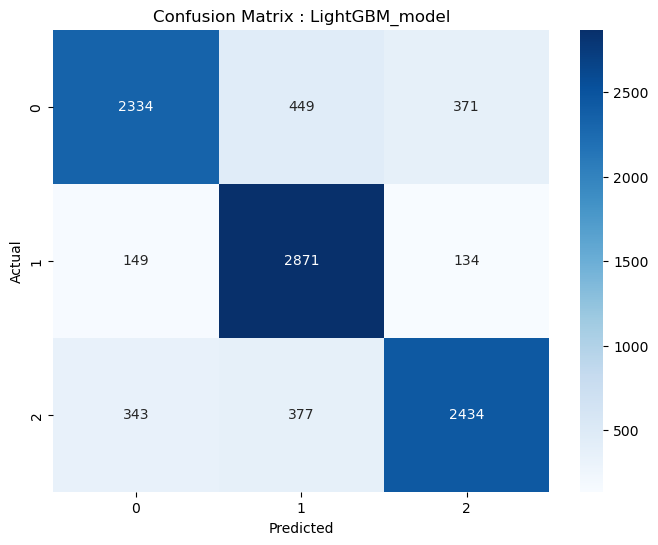

In [20]:
# Log the best model and its performance to MLflow, passing the algo_name as "xgboost"
log_mlflow("LightGBM", best_model, study.best_params) 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\plotly\io\_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.5.7 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



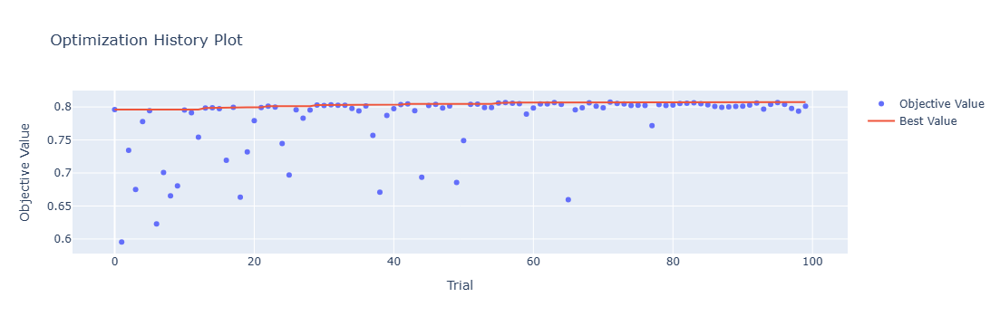

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\plotly\io\_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.5.7 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



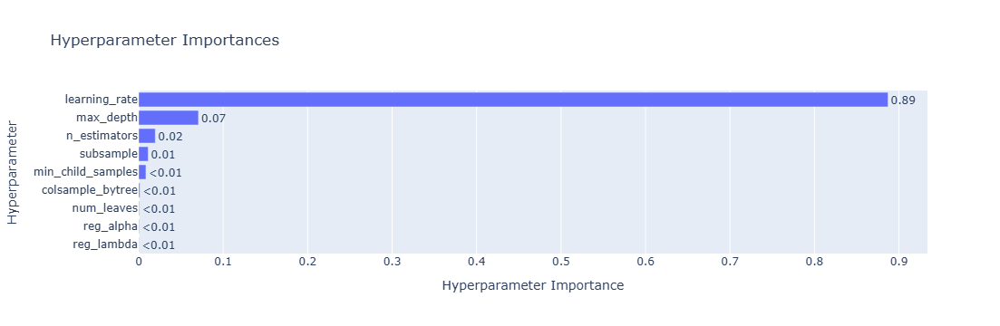

In [21]:
# Visualize optimization history and parameter importance
import plotly

optuna.visualization.plot_optimization_history(study).show()
optuna.visualization.plot_param_importances   (study).show()